In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers import Input, DepthwiseConv2D
from tensorflow.keras.layers import Conv2D, BatchNormalization
from tensorflow.keras.layers import ReLU, Flatten, Dense, AvgPool2D

c:\Users\dangw\anaconda3\envs\cifer\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data = tf.keras.utils.image_dataset_from_directory('Train 2', image_size=(128, 128), batch_size=45)

Found 640658 files belonging to 1000 classes.


In [3]:
test = tf.keras.utils.image_dataset_from_directory('Test', image_size=(128, 128), batch_size=45)

Found 50000 files belonging to 1000 classes.


In [4]:
data_iterator = data.as_numpy_iterator()
test_iterator = test.as_numpy_iterator()

In [5]:
test_iterator

In [6]:
train_batch = data_iterator.next()
test_batch = test_iterator.next()

In [7]:
train_batch[0].shape

(45, 128, 128, 3)

In [8]:
train_batch[1]

array([734,  19, 822, 245, 295, 566, 977, 824, 676, 504, 179, 244, 953,
       472, 202,  55, 358, 385, 742, 893, 629, 740, 349,  75, 428, 254,
       505, 128, 779,  58,  91, 172,  45, 105, 613,  57, 817, 437, 413,
        93, 770,  73, 589, 144,  93])

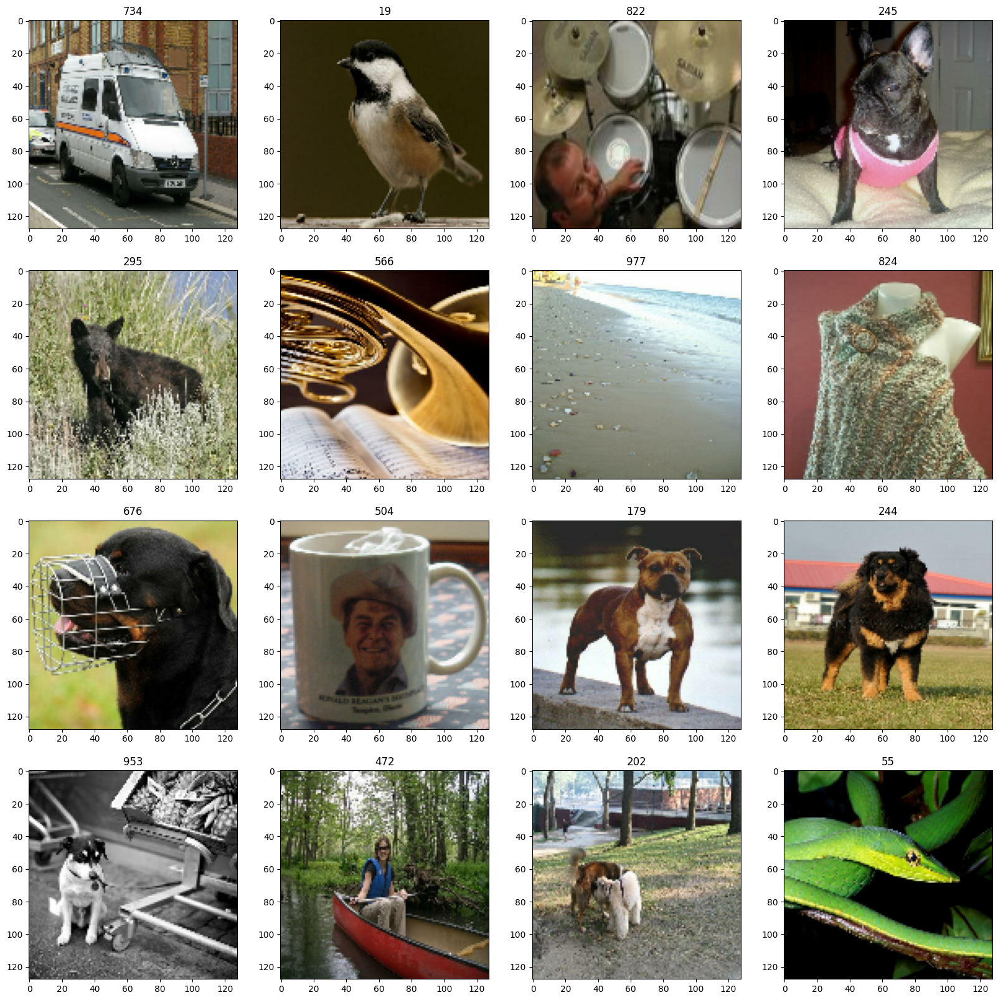

In [9]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = ax.flatten()
for idx, img in enumerate(train_batch[0][:16]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(train_batch[1][idx])

### Preprocessing Data

In [10]:
data = data.map(lambda x, y: (x/255, y))
test = test.map(lambda x, y: (x/255, y))

In [11]:
scaled_iterator = data.as_numpy_iterator()
test_scaled_iterator = test.as_numpy_iterator()

In [12]:
batch = scaled_iterator.next()
test_batch = test_scaled_iterator.next()

In [13]:
batch[0].max()

1.0

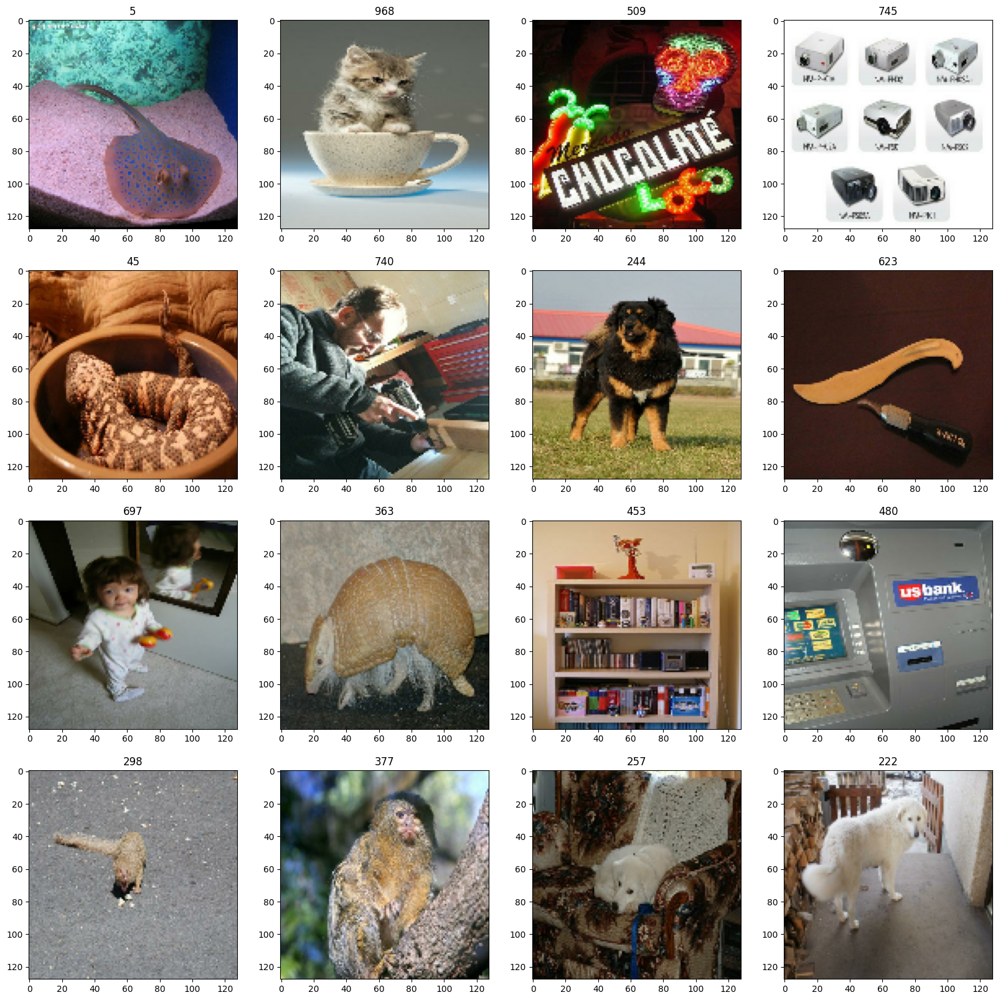

In [14]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = ax.flatten()
for idx, img in enumerate(batch[0][:16]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])

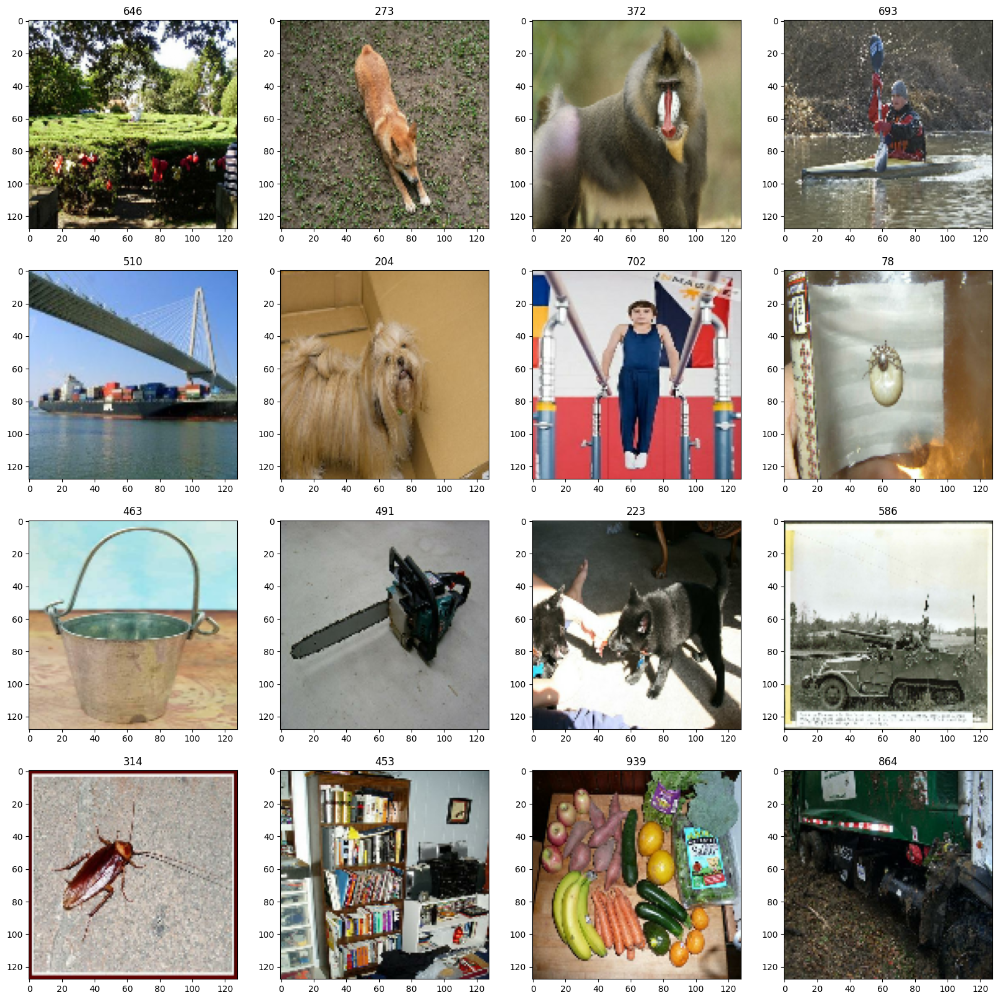

In [15]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(20, 20))
ax = ax.flatten()
for idx, img in enumerate(test_batch[0][:16]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(test_batch[1][idx])

In [16]:
train_size = int(len(data) * 0.8)
val_size = len(data) - train_size

In [17]:
train_size

11389

In [18]:
val_size

2848

In [19]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)

### Model

In [20]:
from tensorflow.keras.applications import MobileNetV2

In [21]:
def mobilnet_block (x, filters, strides):
    
    x = DepthwiseConv2D(kernel_size = 3, strides = strides, padding = 'same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    
    x = Conv2D(filters = filters, kernel_size = 1, strides = 1)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    
    return x


input = Input(shape = (128,128,3))
x = Conv2D(filters = 32, kernel_size = 3, strides = 1, padding = 'same')(input)
x = BatchNormalization()(x)
x = ReLU()(x)

x = mobilnet_block(x, filters = 64, strides = 2)
x = mobilnet_block(x, filters = 128, strides = 1)
x = mobilnet_block(x, filters = 128, strides = 2)
x = mobilnet_block(x, filters = 256, strides = 2)
x = mobilnet_block(x, filters = 512, strides = 1)
x = mobilnet_block(x, filters = 512, strides = 2)
for _ in range (5):
    x = mobilnet_block(x, filters = 512, strides = 1)
x = mobilnet_block(x, filters = 1024, strides = 2)
x = mobilnet_block(x, filters = 1024, strides = 2)
# x = AvgPool2D ()(x)
x = Flatten()(x)
output = Dense (units = 1000, activation = 'softmax')(x)
model = Model(inputs=input, outputs=output)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 32)     128       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 128, 128, 32)      0         
                                                                 
 depthwise_conv2d (Depthwise  (None, 64, 64, 32)       320       
 Conv2D)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 64, 64, 32)       128   

In [22]:
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 32)     128       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 128, 128, 32)      0         
                                                                 
 depthwise_conv2d (Depthwise  (None, 64, 64, 32)       320       
 Conv2D)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 64, 64, 32)       128   

In [24]:
# Train Model
model.fit(train, validation_data=val, epochs=40)

Epoch 1/40
11389/11389 [==============================] - 1559s 137ms/step - loss: 5.4255 - accuracy: 0.0634 - val_loss: 4.8070 - val_accuracy: 0.1124
Epoch 2/40
11389/11389 [==============================] - 1528s 134ms/step - loss: 4.1445 - accuracy: 0.1820 - val_loss: 4.0171 - val_accuracy: 0.2028
Epoch 3/40
11389/11389 [==============================] - 1550s 136ms/step - loss: 3.6181 - accuracy: 0.2537 - val_loss: 3.7366 - val_accuracy: 0.2462
Epoch 4/40
11389/11389 [==============================] - 1540s 135ms/step - loss: 3.2599 - accuracy: 0.3070 - val_loss: 3.6986 - val_accuracy: 0.2792
Epoch 5/40
11389/11389 [==============================] - 1538s 135ms/step - loss: 2.9708 - accuracy: 0.3527 - val_loss: 3.4064 - val_accuracy: 0.2992
Epoch 6/40
11389/11389 [==============================] - 1539s 135ms/step - loss: 2.7758 - accuracy: 0.3852 - val_loss: 3.9302 - val_accuracy: 0.2901
Epoch 7/40
11389/11389 [==============================] - 1538s 135ms/step - loss: 2.5697 - ac

KeyboardInterrupt: 

In [27]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.0001, decay_steps=11389, decay_rate=0.9
)

model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train, validation_data=val, epochs=10)

Epoch 1/10
11389/11389 [==============================] - 1577s 138ms/step - loss: 2.1116 - sparse_categorical_accuracy: 0.5089 - val_loss: 4.1052 - val_sparse_categorical_accuracy: 0.3458
Epoch 2/10
11389/11389 [==============================] - 1550s 136ms/step - loss: 1.9339 - sparse_categorical_accuracy: 0.5442 - val_loss: 3.8145 - val_sparse_categorical_accuracy: 0.3513
Epoch 3/10
11389/11389 [==============================] - 1553s 136ms/step - loss: 1.8466 - sparse_categorical_accuracy: 0.5628 - val_loss: 3.6150 - val_sparse_categorical_accuracy: 0.3513
Epoch 4/10
11389/11389 [==============================] - 1542s 135ms/step - loss: 1.7812 - sparse_categorical_accuracy: 0.5753 - val_loss: 3.6487 - val_sparse_categorical_accuracy: 0.3522
Epoch 5/10
11389/11389 [==============================] - 1589s 140ms/step - loss: 1.7295 - sparse_categorical_accuracy: 0.5860 - val_loss: 3.8976 - val_sparse_categorical_accuracy: 0.3534
Epoch 6/10
11389/11389 [==============================]

In [26]:
model.evaluate(test)

1112/1112 [==============================] - 42s 37ms/step - loss: 3.8091 - sparse_categorical_accuracy: 0.2836


[3.809141159057617, 0.2836199998855591]

In [ ]:
prediction = model.predict(test)

array([[1.1729554e-04, 2.1507537e-06, 1.4491735e-06, ..., 1.6077308e-02,
        1.3024011e-04, 1.4502510e-07],
       [1.9791626e-04, 1.5368685e-06, 8.8518522e-05, ..., 2.8392701e-06,
        3.6289059e-06, 3.1635133e-04],
       [4.3469381e-08, 1.4407215e-07, 6.8744259e-07, ..., 5.5266014e-07,
        6.0233101e-06, 1.2824397e-09],
       ...,
       [3.9989282e-05, 1.9469046e-05, 3.6527810e-04, ..., 5.0231032e-05,
        2.3427347e-04, 1.0133603e-04],
       [5.8886584e-05, 3.6036231e-06, 3.2419854e-04, ..., 3.7000561e-04,
        1.5662476e-05, 3.0444122e-05],
       [1.7989896e-07, 1.8677121e-03, 3.6220084e-05, ..., 4.8963815e-05,
        3.3576764e-06, 1.0261691e-05]], dtype=float32)

In [ ]:
model.predict(test).argmax(-1)

array([565, 426, 568, ..., 904,  24,  71], dtype=int64)

In [28]:
model.save("my_model_2", save_format="tf")  # Saves model + optimizer state

INFO:tensorflow:Assets written to: my_model_2\assets


In [21]:
data_1 = tf.keras.utils.image_dataset_from_directory('Train 1', image_size=(128, 128), batch_size=45)

Found 639639 files belonging to 1000 classes.


In [22]:
data_iterator_1 = data_1.as_numpy_iterator()

In [23]:
train_batch_1 = data_iterator_1.next()

In [24]:
data_1 = data_1.map(lambda x, y: (x/255, y))

In [25]:
scaled_iterator_1 = data_1.as_numpy_iterator()

In [26]:
batch_1 = scaled_iterator_1.next()

In [27]:
train_size_1 = int(len(data_1) * 0.8)
val_size_1 = len(data_1) - train_size_1

In [28]:
train_1 = data_1.take(train_size_1)
val_1 = data_1.skip(train_size_1).take(val_size_1)

In [37]:

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.00005, decay_steps=23000, decay_rate=0.09
)

# Compile the model with RMSprop and scheduled learning rate
model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train_1, validation_data=val_1, epochs=20)

Epoch 1/20
11372/11372 [==============================] - 1574s 138ms/step - loss: 3.1838 - sparse_categorical_accuracy: 0.3368 - val_loss: 3.2331 - val_sparse_categorical_accuracy: 0.3563
Epoch 2/20
11372/11372 [==============================] - 1580s 139ms/step - loss: 3.0783 - sparse_categorical_accuracy: 0.3475 - val_loss: 3.2007 - val_sparse_categorical_accuracy: 0.3590
Epoch 3/20
11372/11372 [==============================] - 1583s 139ms/step - loss: 3.0584 - sparse_categorical_accuracy: 0.3512 - val_loss: 3.1782 - val_sparse_categorical_accuracy: 0.3597
Epoch 4/20
11372/11372 [==============================] - 1579s 139ms/step - loss: 3.0519 - sparse_categorical_accuracy: 0.3521 - val_loss: 3.1956 - val_sparse_categorical_accuracy: 0.3600
Epoch 5/20
11372/11372 [==============================] - 1575s 138ms/step - loss: 3.0504 - sparse_categorical_accuracy: 0.3520 - val_loss: 3.1785 - val_sparse_categorical_accuracy: 0.3601
Epoch 6/20
11372/11372 [==============================]

KeyboardInterrupt: 

In [38]:
model.evaluate(test)

1112/1112 [==============================] - 51s 45ms/step - loss: 3.4405 - sparse_categorical_accuracy: 0.3329


[3.4404900074005127, 0.33292001485824585]

In [39]:
model.save("my_model_3", save_format="tf")  # Saves model + optimizer state

INFO:tensorflow:Assets written to: my_model_3\assets


In [29]:
from tensorflow.keras.models import load_model

In [30]:
model = tf.keras.models.load_model("my_model_3")

In [31]:

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.0005, decay_steps=40000, decay_rate=0.09
)

# Compile the model with RMSprop and scheduled learning rate
model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train_1, validation_data=val_1, epochs=20)

Epoch 1/20
11372/11372 [==============================] - 1639s 143ms/step - loss: 3.0374 - sparse_categorical_accuracy: 0.3533 - val_loss: 2.9778 - val_sparse_categorical_accuracy: 0.3796
Epoch 2/20
11372/11372 [==============================] - 1598s 140ms/step - loss: 2.7179 - sparse_categorical_accuracy: 0.4068 - val_loss: 4.7176 - val_sparse_categorical_accuracy: 0.3918
Epoch 3/20
11372/11372 [==============================] - 1629s 143ms/step - loss: 2.5481 - sparse_categorical_accuracy: 0.4370 - val_loss: 3.8693 - val_sparse_categorical_accuracy: 0.3953
Epoch 4/20
11372/11372 [==============================] - 1632s 143ms/step - loss: 2.4741 - sparse_categorical_accuracy: 0.4506 - val_loss: 3.9935 - val_sparse_categorical_accuracy: 0.3966
Epoch 5/20
11372/11372 [==============================] - 1603s 141ms/step - loss: 2.4329 - sparse_categorical_accuracy: 0.4588 - val_loss: 4.1624 - val_sparse_categorical_accuracy: 0.3973
Epoch 6/20
11372/11372 [==============================]

KeyboardInterrupt: 

In [32]:
model.evaluate(test)

1112/1112 [==============================] - 41s 37ms/step - loss: 4.2121 - sparse_categorical_accuracy: 0.3669


[4.212084770202637, 0.3669399917125702]

In [34]:
model.save("my_model_4", save_format="tf")  # Saves model + optimizer state

INFO:tensorflow:Assets written to: my_model_4\assets


In [ ]:
# Compile the model with RMSprop and scheduled learning rate
model.compile(
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    optimizer= tf.keras.optimizers.Adam(learning_rate=0.00004),
    metrics=[tf.keras.metrics.sparse_categorical_accuracy]
)
model.fit(train, validation_data=val_1, epochs=10)

Epoch 1/10
 5792/11389 [==============>...............] - ETA: 9:12 - loss: 2.2114 - sparse_categorical_accuracy: 0.4933

In [39]:
model.evaluate(test)

1112/1112 [==============================] - 52s 46ms/step - loss: 3.4163 - sparse_categorical_accuracy: 0.3689


[3.4162628650665283, 0.3688800036907196]

In [ ]:
model = tf.keras.models.load_model("my_model_3")

OSError: No file or directory found at my_model_4